## Przygotowanie

Przed rozpoczęciem pracy z notatnikiem proszę zmienić jego nazwę dodając na początku numer albumu, imię i nazwisko.
{nr_albumu}\_{imię}\_{nazwisko}\_{nazwa}

Po wykonaniu wszystkich zadań proszę przesłać wypełniony notatnik przez TEAMS w wiadomości prywatnej.

## Regresja liniowa prosta

Regresja liniowa prosta, to szczególny przypadek regresji liniowej, w którym zmienną objaśnaną przewidujemy za pomocą jednej zmiennej objaśniającej. Zadanie będzie polegało na wyznaczeniu funkcji regresji opisującej zależność zarobków od lat doświadczenia. 

Zbiór danych do tego zadania, to Salary.csv. Znajduje się w katalogu datasets.
W zbiorze danych znajduje się 35 obserwacji. Każdy wpis jest osobną obserwacją. W zbiorze znajdują się 3 kolumny: YearsExperience, Age i Salary. W pierwszym zadaniu należy wykorzystać YearsExperience i Salary, pomijając Age.

### Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from typing import Tuple

### Zadanie 1

Wczytaj dane z pliku Salary.csv, a następnie stwórz wykres przedstawiający obserwacje.

In [2]:
#YOUR CODE HERE
data = pd.read_csv('datasets/Salary.csv', delimiter=',')
data.head()

,YearsExperience,Age,Salary
0,1.1,20,39343
1,1.3,21,46205
2,1.5,21,37731
3,2.0,22,43525
4,2.2,22,39891


In [3]:
data.describe()

,YearsExperience,Age,Salary
count,35.000000,35.000000,35.000000
mean,6.308571,28.371429,83888.428571
std,3.618610,5.568217,32200.112889
min,1.100000,20.000000,37731.000000
25%,3.450000,24.000000,57019.000000
50%,5.300000,27.000000,81363.000000
75%,9.250000,32.500000,113223.500000
max,13.500000,40.000000,139465.000000


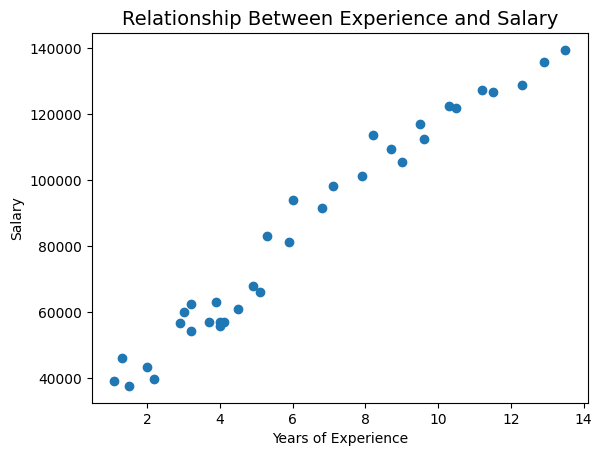

In [4]:
x = data['YearsExperience']
y = data['Salary']

plt.scatter(x, y)
plt.xlabel('Years of Experience')
plt.ylabel('Salary')
plt.title('Relationship Between Experience and Salary', fontsize=14)
plt.show()

In [5]:
x.shape

(35,)

In [6]:
y.shape

(35,)

In [7]:
len(x)

35

In [8]:
type(x)
x = x.values

In [9]:
x

array([ 1.1,  1.3,  1.5,  2. ,  2.2,  2.9,  3. ,  3.2,  3.2,  3.7,  3.9,
        4. ,  4. ,  4.1,  4.5,  4.9,  5.1,  5.3,  5.9,  6. ,  6.8,  7.1,
        7.9,  8.2,  8.7,  9. ,  9.5,  9.6, 10.3, 10.5, 11.2, 11.5, 12.3,
       12.9, 13.5])

In [10]:
x1 = x.reshape(-1, 1)
x1

array([[ 1.1],
       [ 1.3],
       [ 1.5],
       [ 2. ],
       [ 2.2],
       [ 2.9],
       [ 3. ],
       [ 3.2],
       [ 3.2],
       [ 3.7],
       [ 3.9],
       [ 4. ],
       [ 4. ],
       [ 4.1],
       [ 4.5],
       [ 4.9],
       [ 5.1],
       [ 5.3],
       [ 5.9],
       [ 6. ],
       [ 6.8],
       [ 7.1],
       [ 7.9],
       [ 8.2],
       [ 8.7],
       [ 9. ],
       [ 9.5],
       [ 9.6],
       [10.3],
       [10.5],
       [11.2],
       [11.5],
       [12.3],
       [12.9],
       [13.5]])

### Zadanie 2

Implementacja algorytmu regresji liniowej prostej.

Żeby dobrze zrozumieć zapis matematyczny, który początkowo może sprawiać problemy, przejdziemy po kolei po elementach składowych algorytmu. Następnie złączymy elementy w całość.

Wzór na regresję liniową w naszym przypadku będzie wyglądał następująco:

\begin{equation}
f(x^{(i)}) = \beta_{0} + \beta_{1}x_1 = \beta_{0} + \beta_{1}  YearsExperience
\end{equation}

Przypomnijmy, że zapis $x^{(i)}$ oznacza wektor dla $i$-tej obserwacji. W naszym przypadku ten wektor będzie zawierał tylko $1$ wartość dla cechy $YearsExperience$.


_Uwaga: W różnych źródłach algorytm regresji liniowej ma różne zapisy. Czasem podawane są wzory w postaci z sumą, czasem w postaci macierzowej. Jest to spowodowane tym, że algorytm można zaimplementować na te dwa sposoby. Łatwiejszym i bardziej intuicyjnym podejściem jest podejście z sumą, która bezpośrednio sugeruje wykokrzystanie pętli w celu iteracji po obserwacjach/cechach. Implementacja z wykorzystaniem macierzy jest zwykle krótsza i "bardziej elegancka", ale również bardziej wydajna. Aby dobrze zrozumieć działanie algorytmu, najlepiej jest zaimplementować obie wersje i porównać je ze sobą._


#### 2.1 Inicjalizacja współczynników $\beta$ regresji

Pierwszym krokiem jest inicjalizacja współczynników regresji. W przypadku regresji liniowej prostej mamy dwa współczynniki $\beta_{0}$ i $\beta_{1}$. Stwórz dwie zmienne będące współczynnikami regresji liniowej prostej i zainicjalizuj je losowymi wartościami z przedziału $(0,1)$.

Dodatkowo stwórz zmienną *alpha*, która przyjmie wartość od $(0,1)$. Możesz ustawić ją ręcznie i sprawdzać jak różne wartości mają wpływ na regresję. 

In [11]:
def initialize_coefficients() -> Tuple[float, float, float]:
    epsilon = 1e-8
    
    beta0 = np.random.rand() + epsilon
    beta1 = np.random.rand() + epsilon
    alpha = np.random.rand() * 0.01 + epsilon # przy wartościach (0, 1) wyniki były zaburzone 
    
    return beta0, beta1, alpha

In [12]:
# Test
beta0, beta1, alpha = initialize_coefficients()
print(beta0)

0.00651777833976514


#### 2.2 Obliczenie predykcji

Kolejnym krokiem jest obliczenie wartości funkcji regresji dla wszystkich obserwacji w zbiorze danych. Jest to po prostu wstawienie kolejnych wartości pod wzrór regresji.

\begin{equation}
f(x) = \beta_{0} + \beta_{1}x_1
\end{equation}

Można zrobić to z wykorzystaniem operacji na macierzach (wektorach), albo z wykorzystaniem klasycznej iteracji. 

In [13]:
def calculate_regression_function(x: np.ndarray, beta0: float, beta1: float) -> np.ndarray:
    return beta0 + beta1 * x

In [14]:
# Test
predictions = calculate_regression_function(x, beta0, beta1)
predictions

array([ 0.96074739,  1.13424368,  1.30773997,  1.7414807 ,  1.91497699,
        2.52221402,  2.60896216,  2.78245846,  2.78245846,  3.21619919,
        3.38969548,  3.47644363,  3.47644363,  3.56319177,  3.91018436,
        4.25717694,  4.43067323,  4.60416953,  5.1246584 ,  5.21140655,
        5.90539172,  6.16563616,  6.85962133,  7.11986577,  7.5536065 ,
        7.81385094,  8.24759167,  8.33433981,  8.94157684,  9.11507313,
        9.72231015,  9.98255459, 10.67653976, 11.19702864, 11.71751752])

#### 2.3 Obliczenie błędu

Obliczenie wartości błędu regresji nie jest konieczne do aktualizacji wag, jednak jest to bardzo cenna informacja czy nasz algorytm działa poprawnie. Wartość błędu nie może rosnąć w kolejnych epokach.

Błąd należy obliczyć zgodnie ze wzorem:

\begin{equation}
    SSR = \frac{1}{2m} \sum_{i=1}^{m}(f(x^{(i)}) - y^{(i)})^2
\end{equation}

In [15]:
y

0      39343
1      46205
2      37731
3      43525
4      39891
5      56642
6      60150
7      54445
8      62444
9      57189
10     63218
11     55794
12     56957
13     57081
14     61111
15     67938
16     66029
17     83088
18     81363
19     93940
20     91738
21     98273
22    101302
23    113812
24    109431
25    105582
26    116969
27    112635
28    122391
29    121872
30    127345
31    126756
32    128765
33    135675
34    139465
Name: Salary, dtype: int64

In [16]:
def calculate_error(predictions: np.ndarray, y: np.ndarray) -> float:
    ssr = 1/( 2*len(y) )*np.sum((predictions-y)**2)
    return ssr

In [17]:
# Test
calculate_error(predictions, y)

4021689635.9120517

#### 2.4 Obliczenie gradientu 

Żeby obliczyć gradient, należy obliczyć pochodne cząstkowe względem parametrów $\beta_{0}$ i $\beta_{1}$.

\begin{equation}
    \frac{\partial SSR}{\partial \beta_{0}} = \frac{1}{m} \sum^{m}_{i=1} (f(x^{(i)}) - y^{(i)})
\end{equation}

\begin{equation}
    \frac{\partial SSR}{\partial \beta_{1}} = \frac{1}{m} \sum^{m}_{i=1} (f(x^{(i)}) - y^{(i)})x_{1}^{(i)}
\end{equation}

Tutaj ponownie jak wcześniej można wykorzystać operacje na macierzach, lub iteracyjnie obliczyć sumę.

In [18]:
def calculate_gradient(predictions: np.ndarray, y: np.ndarray, x: np.ndarray) -> Tuple[float, float]:
    m = len(y)
    error = predictions - y
    grad_0 = (1.0/m) * np.sum(error)
    grad_1 = (1.0/m) * np.sum(error*x)

    return grad_0, grad_1

In [19]:
# Test
grad_0, grad_1 = calculate_gradient(predictions, y, x)

####  2.5 Aktualizacja współczynników regresji (wag)

Po obliczeniu pochodnych cząstkowych należy obliczyć nowe wartości dla współczynników regresji.


\begin{equation}
    \beta_{0} = \beta_{0} - \alpha \frac{\partial SSR}{\partial \beta_{0}} 
\end{equation}

\begin{equation}
    \beta_{1} = \beta_{1} - \alpha \frac{\partial SSR}{\partial \beta_{1}} 
\end{equation}

In [20]:
def update_regression_coefficients(grad_0: float, grad_1: float, beta0: float, beta1: float, alpha: float) -> Tuple[float, float]:
    beta0_new = beta0 - alpha*grad_0
    beta1_new = beta1 - alpha*grad_1

    return beta0_new, beta1_new

In [21]:
# Test
update_regression_coefficients(grad_0, grad_1, beta0, beta1, alpha)

(791.1399703851607, 6040.927019859882)

#### 2.6 Finalna wersja algorytmu

Powyższe działania, to wszystkie elementy potrzebne do stworzenia algorytmu regresji liniowej prostej. Jeden cykl takich operacji nazywany jest **epoką**. Idea obliczania współczynników regresji z wykorzystaniem gradientu polega na iteracyjnym aktualizowaniu współczynników do momentu, aż błąd przestanie znacznie się zmieniać. Można również ustawić jakaś stałą ilość epok. W każdej epoce wykorzystuje się ponownie ten sam zestaw danych.

Skoro wiadomo już jakie pojedyncze etapy należy wykonać, żeby obliczyć regresję liniową prostą, przyszedł czas na zebranie wszystkiego w jednym miejscu.

Proszę zaimplementować funkcję `learn_and_fit(x, y)`, która dla danych wejściowych będzie zwracać współczynniki regresji w każdej z epok. Dodatkowo proszę zwracać również błąd regresji w każdej epoce. Funkcja może być zaimplementowana w dowolny sposób. Może bezpośrednio zawierać wszystkie instrukcje, może korzystać z innych funkcji pomocniczych albo może korzystać z klasy reprezentującą regresję liniową prostą. 

Na końcu notebooka znajduje się test jednostkowy, który musi przechodzić przy prawidłowej implementacji algorytmu.

In [22]:
'''
input:
x - wartości zmiennej objaśniającej YearsExperience dla wszystkich obserwacji
y - wartości zmiennej objaśnianej Salary dla wszystkich obserwacji

output:
b0: [] - lista z współczynnikami beta_0 w każdej z epok
b1: [] - lista z współczynnikami beta_1 w każdej z epok
error: [] - lista z błędem w każdej epoce
'''

def learn_and_fit(x: np.ndarray, y: np.ndarray) -> Tuple[np.array, np.array, np.array]:
    beta0, beta1, alpha = initialize_coefficients()
    
    b0 = []
    b1 = []
    error = []
    epoch = 100
    
    for i in range(epoch):
        predictions = calculate_regression_function(x, beta0, beta1)
        err = calculate_error(predictions, y)
        b0.append(beta0)
        b1.append(beta1)
        error.append(err)
        
        if err < 0.01:
            print(f" Warunek spełniony: err < 0.01, osiągnięto w {i+1} epoce")
            break
        grad_b0, grad_b1 = calculate_gradient(predictions, y, x)
        beta0, beta1 = update_regression_coefficients(grad_b0, grad_b1, beta0, beta1, alpha)

    return np.array(b0), np.array(b1), np.array(error)

#### Wywołanie funkcji

In [23]:
b0, b1, err = learn_and_fit(x, y)

### Zadanie 3

Stwórz wykres zmiany błędu regresji (oś Y) względem epoki (oś X)

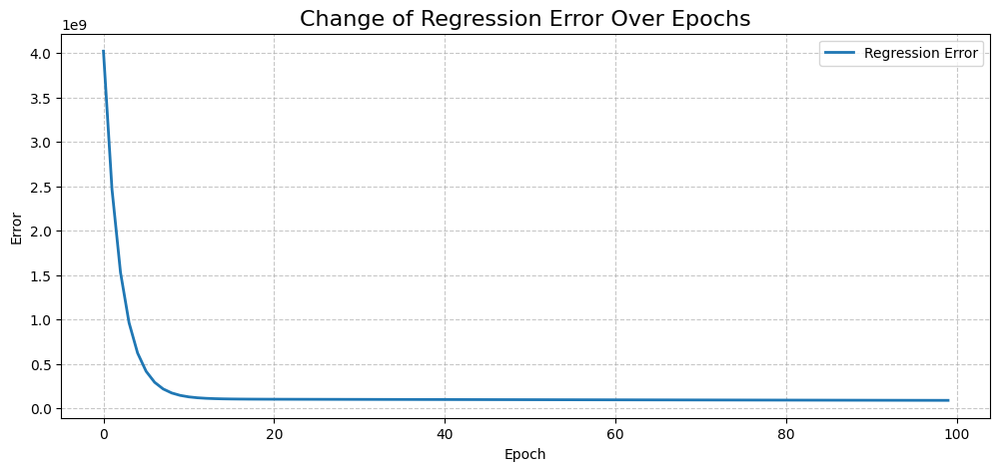

In [24]:
plt.figure(figsize=(12, 5))
plt.plot(range(len(err)), err, label="Regression Error", linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("Error")
plt.title("Change of Regression Error Over Epochs", fontsize=16)
plt.grid(True, linestyle="--", alpha=0.7)
plt.legend()
plt.show()


### Zadanie 4

Do wykresu stworzonego w zadaniu 1 dodaj prostą regresji. Stwórz 3 wykresy przedstawiające jak zmieniała się funkcja regresji na przestrzeni epok (pierwsza, środkowa, ostatnia epoka).

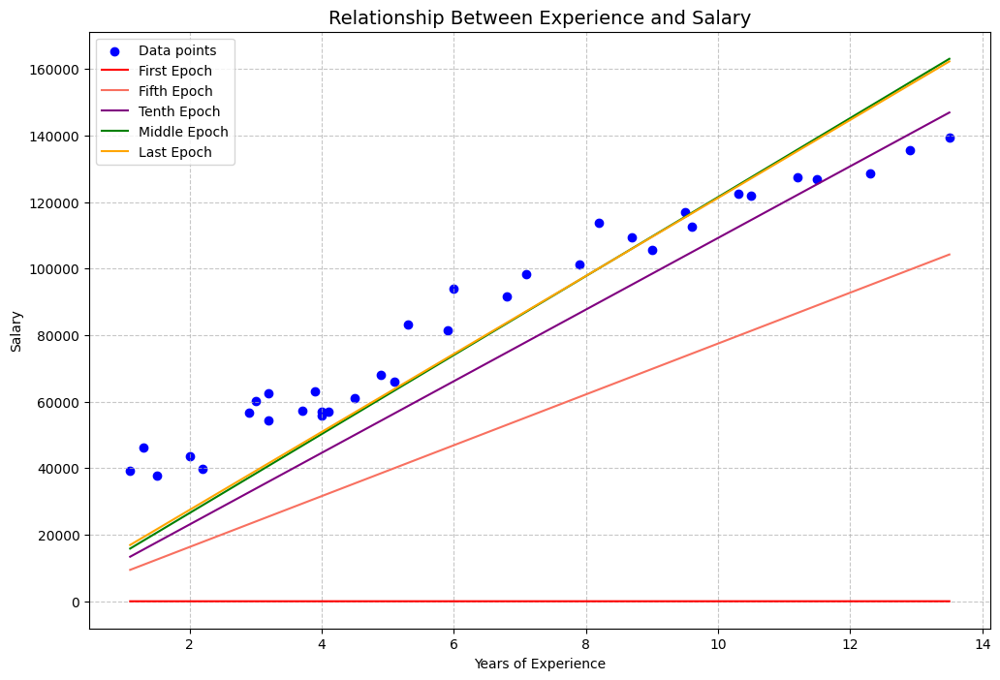

In [25]:
plt.figure(figsize=(12, 8))

epochs_to_plot = [0, 4,9, len(b0)//2, len(b0)-1]
colors = ['red', '#F87060', 'purple', 'green', 'orange']
labels = ['First Epoch', 'Fifth Epoch', 'Tenth Epoch', 'Middle Epoch', 'Last Epoch']


x = data['YearsExperience']
y = data['Salary']

plt.scatter(x, y, color='blue', label='Data points')
plt.xlabel('Years of Experience')
plt.ylabel('Salary')
plt.title('Relationship Between Experience and Salary', fontsize=14)

for idx, color, label in zip(epochs_to_plot, colors, labels):
    y_line = b0[idx] + b1[idx]*x
    plt.plot(x, y_line, color=color, label=label)

plt.grid(True, linestyle="--", alpha=0.7)
plt.legend()
plt.show()

#Stworzyłam jeden ale nałożyłam na niego kilka linii

In [26]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

frames = []

fig, ax = plt.subplots(figsize=(12,8))
scat = ax.scatter(x, y, color='blue', label='Data')
line, = ax.plot([], [], color='red', label='Regression Line')
ax.set_xlabel("Years of Experience")
ax.set_ylabel("Salary")
ax.set_title("Regression Fit Progress")
ax.grid(True, linestyle="--", alpha=0.7)
ax.legend()

# Tekst, który będzie aktualizowany (błąd i numer epoki)
text = ax.text(0.05, 0.95, '', transform=ax.transAxes, fontsize=12,
               verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

def init():
    line.set_data([], [])
    text.set_text('')
    return line, text

def update(frame):
    y_pred = b0[frame] + b1[frame]*x
    line.set_data(x, y_pred)
    ax.set_title(f"Regression Fit Progress - Epoch {frame+1}\nError: {err[frame]:.4f}")
    return line, text

animation = FuncAnimation(fig, update, frames=len(b0), init_func=init, blit=True, interval=150)
plt.close(fig)
HTML(animation.to_jshtml())

### Zadanie 5

Wybierz dowolnie trzy różne wartości współczynnika $\alpha$. Ile epok mu zostać użytych żeby otrzymać zamierzoną wartość błędu?

In [27]:
# Zmiana funkcji
def initialize_coefficients() -> Tuple[float, float]:
    epsilon = 1e-8
    
    beta0 = np.random.rand() + epsilon
    beta1 = np.random.rand() + epsilon
    
    return beta0, beta1

def learn_and_fit(x: np.ndarray, y: np.ndarray, alpha: float = 0.01, epoch: float = 100, stop_value: float = 0.01) -> Tuple[np.array, np.array, np.array]:
    beta0, beta1 = initialize_coefficients()
    
    b0 = []
    b1 = []
    error = []
    # epoch = 100 
    
    for i in range(epoch):
        predictions = calculate_regression_function(x, beta0, beta1)
        err = calculate_error(predictions, y)
        b0.append(beta0)
        b1.append(beta1)
        error.append(err)
        
        if err < stop_value:
            print(f" Warunek spełniony: err < 0.01, osiągnięto w {i+1} epoce")
            break
        grad_b0, grad_b1 = calculate_gradient(predictions, y, x)
        beta0, beta1 = update_regression_coefficients(grad_b0, grad_b1, beta0, beta1, alpha)

    return np.array(b0), np.array(b1), np.array(error)

In [28]:
alphas = [0.002, 0.01, 0.05]

for a in alphas:
    print(f" Wartość alpha: {a}")
    learn_and_fit(x, y, a, stop_value = 70000000, epoch = 1000)

 Wartość alpha: 0.002
 Warunek spełniony: err < 0.01, osiągnięto w 558 epoce
 Wartość alpha: 0.01
 Warunek spełniony: err < 0.01, osiągnięto w 113 epoce
 Wartość alpha: 0.05


C:\Users\Iza\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


### Testy jednostkowe

In [29]:
import unittest
import pandas as pd

class SimpleLinearRegressionTest(unittest.TestCase):
    
    def test_learn_and_fit(self):
        df = pd.read_csv('datasets/Salary.csv', sep=',')
        x = df['YearsExperience'].values.reshape(df['YearsExperience'].shape[0], 1)
        y = df['Salary'].values.reshape(df['Salary'].shape[0], 1)
        
        b0, b1, error = learn_and_fit(x, y)
        
        self.assertTrue(len(b0) > 1)
        self.assertTrue(len(b1) > 1)
        self.assertTrue(len(b0) == len(b1))
        self.assertTrue(all(i >= j for i, j in zip(error, error[1:]))) #Sprawdzenie, czy błędy nie rosną
        
unittest.main(argv=[''], verbosity=2, exit=False)

test_learn_and_fit (__main__.SimpleLinearRegressionTest) ... ok

----------------------------------------------------------------------
Ran 1 test in 0.017s

OK


### Zadanie 6

Stwórz test jednostkowy sprawdzający czy funkcja inicjalizująca współczynniki regresji zwraca wartości z przedziału (0, 1)

In [30]:
class CoefficientsTest(unittest.TestCase):
    
    def test_initialize_coefficients(self):
        b0, b1 = initialize_coefficients()
        
        self.assertTrue(b0 < 1) # self.assertLess(b0, 1)
        self.assertTrue(b1 < 1)
        self.assertTrue(b0 > 0) # self.assertGreater(b0, 0)
        self.assertTrue(b1 > 0)
        
unittest.main(argv=[''], verbosity=2, exit=False)

test_initialize_coefficients (__main__.CoefficientsTest) ... ok
test_learn_and_fit (__main__.SimpleLinearRegressionTest) ... ok

----------------------------------------------------------------------
Ran 2 tests in 0.021s

OK
